<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Calculation-of-Silicon-Parameters" data-toc-modified-id="Calculation-of-Silicon-Parameters-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Calculation of Silicon Parameters</a></span></li><li><span><a href="#Going-Further-with-$T_1$" data-toc-modified-id="Going-Further-with-$T_1$-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Going Further with $T_1$</a></span></li></ul></div>

In [1]:
%matplotlib inline
from standardFunctions import *
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import os
import pandas as pd
from loadBrukerData.loadBrukerData import loadBrukerData
from numpy.fft import fft
from math import floor
from matplotlib.ticker import AutoMinorLocator
from scipy.optimize import curve_fit
import plotly as lpy
import plotly.graph_objs as go
import ipywidgets as widgets
lpy.offline.init_notebook_mode(connected=True)
t1_1058 = pd.read_pickle('../Data/t1_1058.pkl')
t2_1058 = pd.read_pickle('../Data/t2_1058.pkl')

In [2]:
plt.rcParams['axes.linewidth'] = 4.0
plt.rcParams['xtick.major.size'] = 12.0
plt.rcParams['xtick.major.width'] = 4.0
plt.rcParams['xtick.minor.size'] = 8.0
plt.rcParams['xtick.minor.width'] = 2.0
plt.rcParams['ytick.major.size'] = 12.0
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.major.width'] = 4.0
plt.rcParams['ytick.minor.visible'] = False
plt.rcParams['ytick.minor.size'] = 8.0
plt.rcParams['ytick.minor.width'] = 2.0
plt.rcParams['ytick.direction'] = 'out'
plt.rcParams['xtick.labelsize'] = 30.0
plt.rcParams['ytick.labelsize'] = 30.0
plt.rcParams['axes.labelsize'] = 36.0
plt.rcParams['figure.figsize'] = (20,15)
plt.rcParams['lines.linewidth'] = 4.0
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams.update({'figure.autolayout': False})
# minorLocator = AutoMinorLocator()
plt.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'k',
          'axes.facecolor': 'w',
          'axes.formatter.limits': [-7, 7],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.

In [3]:
donDens = 6e21
mu_0 = 1.257e-6
mu_B = 9.274e-24
hbar = 1.054e-34
K_B = 1.381e-23
c = 299792458


In [4]:
# Delt = 122.5
# A =2.4
# B=1e-7
# om = 6.43e-24
om = 9.77e9
# Delt = 1.693-21
Delt = 2552e9
K_B=2.08e10

# T_1 = A*(om**4)*T + B*T**9 + E*np.exp(-Delt/(K_B*T))

In [5]:
def fixx1(x, A, B, E):
    return (A*(om**4)*x + B*(x**9) + E/(np.exp(Delt/(K_B*x))-1))

In [6]:
data = np.genfromtxt('Default Dataset.csv', delimiter = ',')
temps = data[:,0]
times = data[:,1]#-0.033
rates = 1/times

In [7]:
popt, pcov = curve_fit(fixx1, temps, rates)#, bounds=(0, 0.00000001))

In [8]:
popt

array([  1.75412922e-38,   2.12441205e-08,   8.12439135e+07])

In [9]:
popt[0] = 3e-45
# popt[1] = 2e-20
# popt[2] = 8e20


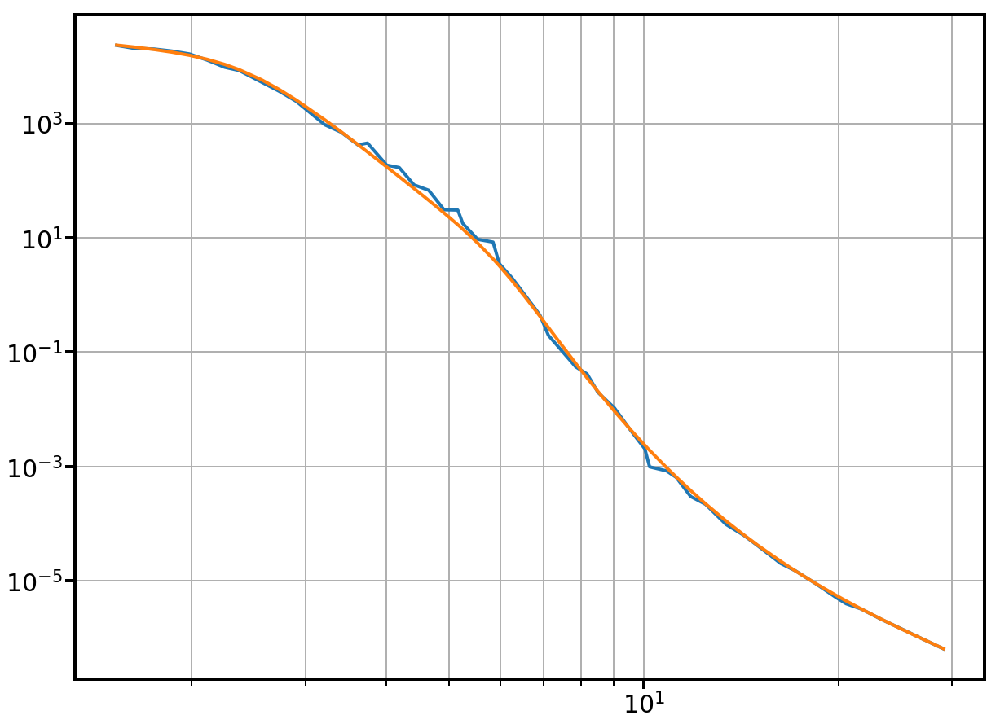

In [10]:
plt.plot(temps, 1/rates)
plt.plot(temps, 1/(fixx1(temps, *popt)))
plt.xscale('log')
plt.yscale('log')
# plt.ylim(0.00000001, 30000)
plt.grid(which='both', linewidth=2)

In [11]:
print(temps[31], times[31])

8.17701906385 0.041616994093


In [12]:
fixx1(8.00, *popt)

20.602314314432167

In [13]:
temps2 = np.linspace(0.01, 300, 1000)

/Users/davidwise/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: RuntimeWarning:

overflow encountered in exp



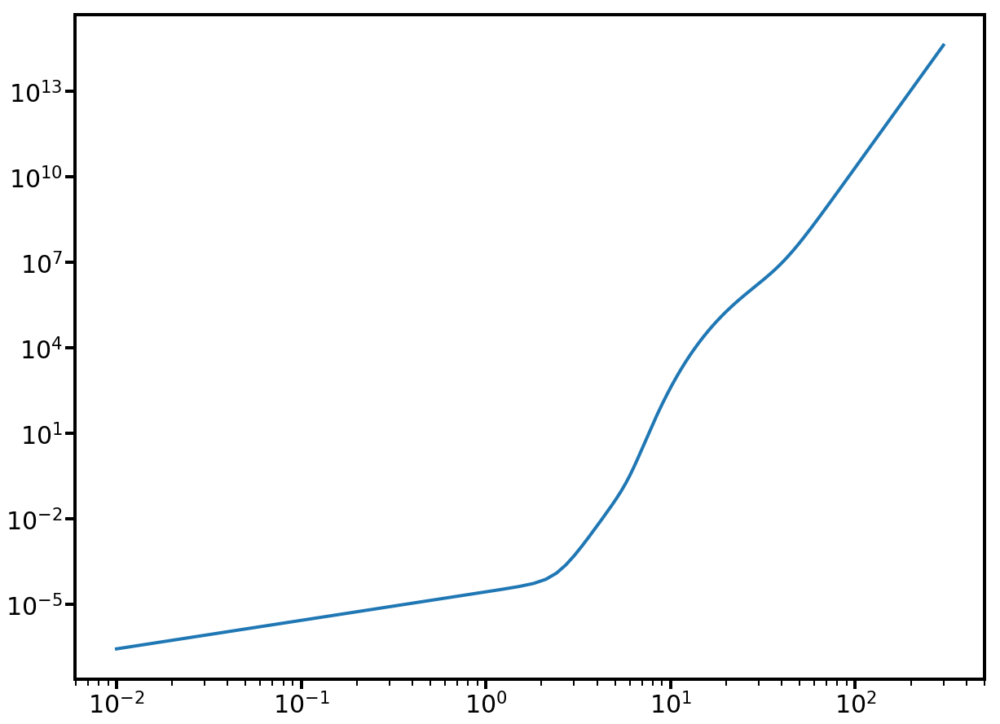

In [14]:
plt.plot(temps2, (fixx1(temps2, *popt)))
plt.xscale('log')
plt.yscale('log')

# Calculation of Silicon Parameters

In [15]:
Dens = 2.3296
Vol = 0.2*0.2*1
Mass = Dens*Vol
molMass = 28.08550
heatCap = 0.00396

In [16]:
Mass
Mass/molMass*heatCap

1.3138759858289868e-05

In [17]:
moles = Mass/molMass
moles

0.0033178686510833

In [18]:
joulKelv = moles*0.003960

In [19]:
joulKelv

1.3138759858289868e-05

In [20]:
# powersT1 = np.array([  6.72032456e-01,   3.79106780e-04,   1.75726000e+00,
#          7.64864000e+00,   1.58000000e-03,   0.00000000e+00,
#          4.79882000e+00,   1.02728800e+01,   9.02606055e-01,
#          2.00000000e+01,   1.42400000e-02,   4.21638722e-01])
powersT1 = np.logspace(-5,2, 100)

In [21]:
powersT1
powersT12 = powersT1/500000

In [22]:
powersT1


array([  1.00000000e-05,   1.17681195e-05,   1.38488637e-05,
         1.62975083e-05,   1.91791026e-05,   2.25701972e-05,
         2.65608778e-05,   3.12571585e-05,   3.67837977e-05,
         4.32876128e-05,   5.09413801e-05,   5.99484250e-05,
         7.05480231e-05,   8.30217568e-05,   9.77009957e-05,
         1.14975700e-04,   1.35304777e-04,   1.59228279e-04,
         1.87381742e-04,   2.20513074e-04,   2.59502421e-04,
         3.05385551e-04,   3.59381366e-04,   4.22924287e-04,
         4.97702356e-04,   5.85702082e-04,   6.89261210e-04,
         8.11130831e-04,   9.54548457e-04,   1.12332403e-03,
         1.32194115e-03,   1.55567614e-03,   1.83073828e-03,
         2.15443469e-03,   2.53536449e-03,   2.98364724e-03,
         3.51119173e-03,   4.13201240e-03,   4.86260158e-03,
         5.72236766e-03,   6.73415066e-03,   7.92482898e-03,
         9.32603347e-03,   1.09749877e-02,   1.29154967e-02,
         1.51991108e-02,   1.78864953e-02,   2.10490414e-02,
         2.47707636e-02,

In [23]:
heating = powersT12/joulKelv

In [24]:
heating

array([  1.52221368e-06,   1.79135925e-06,   2.10809298e-06,
         2.48082902e-06,   2.91946924e-06,   3.43566629e-06,
         4.04313316e-06,   4.75800743e-06,   5.59928001e-06,
         6.58929964e-06,   7.75436658e-06,   9.12543127e-06,
         1.07389166e-05,   1.26376854e-05,   1.48721792e-05,
         1.75017583e-05,   2.05962783e-05,   2.42379465e-05,
         2.85235052e-05,   3.35668018e-05,   3.95018136e-05,
         4.64862063e-05,   5.47055232e-05,   6.43781136e-05,
         7.57609336e-05,   8.91563722e-05,   1.04920284e-04,
         1.23471445e-04,   1.45302672e-04,   1.70993921e-04,
         2.01227690e-04,   2.36807151e-04,   2.78677486e-04,
         3.27950996e-04,   3.85936652e-04,   4.54174865e-04,
         5.34478409e-04,   6.28980580e-04,   7.40191865e-04,
         8.71066634e-04,   1.02508163e-03,   1.20632831e-03,
         1.41962157e-03,   1.67062764e-03,   1.96601457e-03,
         2.31362944e-03,   2.72270678e-03,   3.20411388e-03,
         3.77063952e-03,

In [25]:
temp = heating+8
temp

array([  8.00000152,   8.00000179,   8.00000211,   8.00000248,
         8.00000292,   8.00000344,   8.00000404,   8.00000476,
         8.0000056 ,   8.00000659,   8.00000775,   8.00000913,
         8.00001074,   8.00001264,   8.00001487,   8.0000175 ,
         8.0000206 ,   8.00002424,   8.00002852,   8.00003357,
         8.0000395 ,   8.00004649,   8.00005471,   8.00006438,
         8.00007576,   8.00008916,   8.00010492,   8.00012347,
         8.0001453 ,   8.00017099,   8.00020123,   8.00023681,
         8.00027868,   8.00032795,   8.00038594,   8.00045417,
         8.00053448,   8.00062898,   8.00074019,   8.00087107,
         8.00102508,   8.00120633,   8.00141962,   8.00167063,
         8.00196601,   8.00231363,   8.00272271,   8.00320411,
         8.00377064,   8.00443733,   8.00522191,   8.0061452 ,
         8.00723175,   8.00851041,   8.01001515,   8.01178595,
         8.01386984,   8.0163222 ,   8.01920816,   8.02260439,
         8.02660112,   8.03130451,   8.03683952,   8.04

In [26]:
T1s = 1/(fixx1(temp, *popt))
# T1s
# T2_SD = np.sqrt(T1s)

In [27]:
T1s = (0.0064/0.042)*T1s

In [28]:
T2_ID_rate = ((5/2) *(mu_0/(4*np.pi))*((2*mu_B)**2/(hbar))*(donDens/2))
T2_SD = np.sqrt((18*np.sqrt(3)/mu_0)*(hbar/((2*mu_B)**2))*(T1s/donDens))
T2_SD_rate = 1/T2_SD
T2_rate = T2_ID_rate + T2_SD_rate + 1/T1s
T2s = 1/T2_rate
1/T2_ID_rate
1/T2_SD_rate
T2s = T2s

In [29]:
T1s = T1s*1000
T2s = T2s*1000

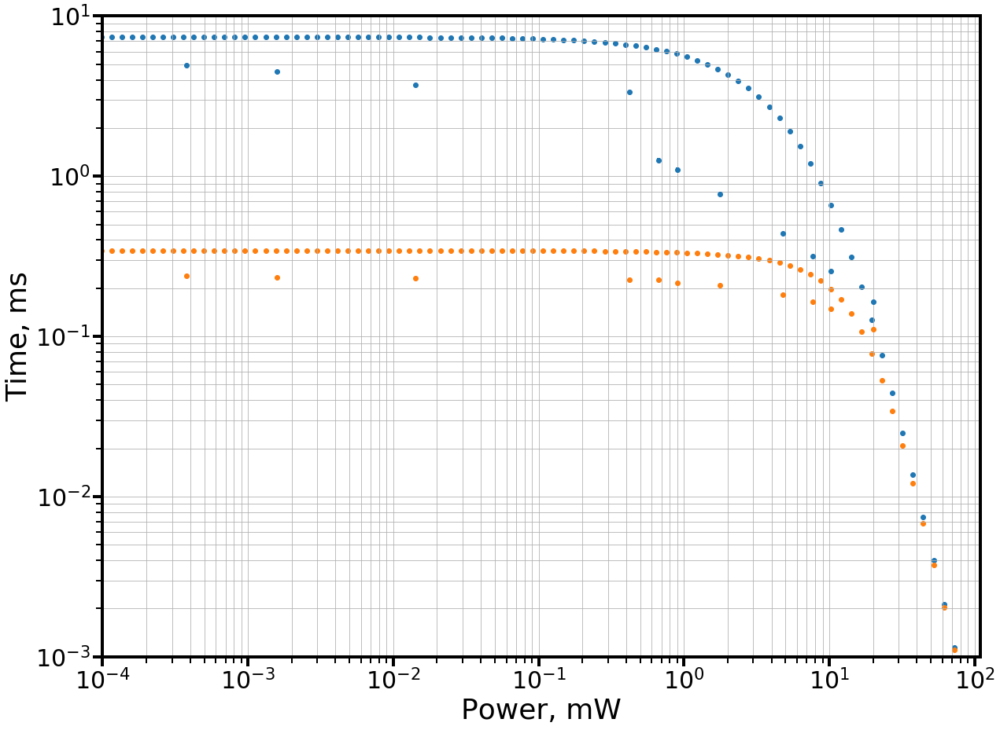

In [30]:
t1 = plt.scatter(powersT1, T1s)
plt.scatter(powersT1, T2s)
plt.errorbar(t1_1058.index.values, t1_1058['T1a'], yerr = t1_1058['T1a Error'], linestyle = 'none', marker = 'o')
plt.errorbar(t2_1058.index.values, t2_1058['T2'], yerr = t2_1058['T2 Error'], linestyle = 'none', marker = 'o')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Power, mW')
plt.ylabel('Time, ms')
plt.xlim([0.0001, 110])
plt.ylim([0.001, 10])
plt.grid(which='both')

In [31]:
T1s

array([  7.39628232e+00,   7.39627872e+00,   7.39627449e+00,
         7.39626951e+00,   7.39626364e+00,   7.39625674e+00,
         7.39624862e+00,   7.39623906e+00,   7.39622782e+00,
         7.39621458e+00,   7.39619901e+00,   7.39618068e+00,
         7.39615911e+00,   7.39613373e+00,   7.39610386e+00,
         7.39606871e+00,   7.39602734e+00,   7.39597866e+00,
         7.39592137e+00,   7.39585396e+00,   7.39577462e+00,
         7.39568126e+00,   7.39557139e+00,   7.39544210e+00,
         7.39528995e+00,   7.39511091e+00,   7.39490021e+00,
         7.39465227e+00,   7.39436051e+00,   7.39401717e+00,
         7.39361314e+00,   7.39313772e+00,   7.39257827e+00,
         7.39191997e+00,   7.39114536e+00,   7.39023390e+00,
         7.38916144e+00,   7.38789958e+00,   7.38641492e+00,
         7.38466817e+00,   7.38261317e+00,   7.38019562e+00,
         7.37735176e+00,   7.37400662e+00,   7.37007217e+00,
         7.36544505e+00,   7.36000393e+00,   7.35360646e+00,
         7.34608575e+00,

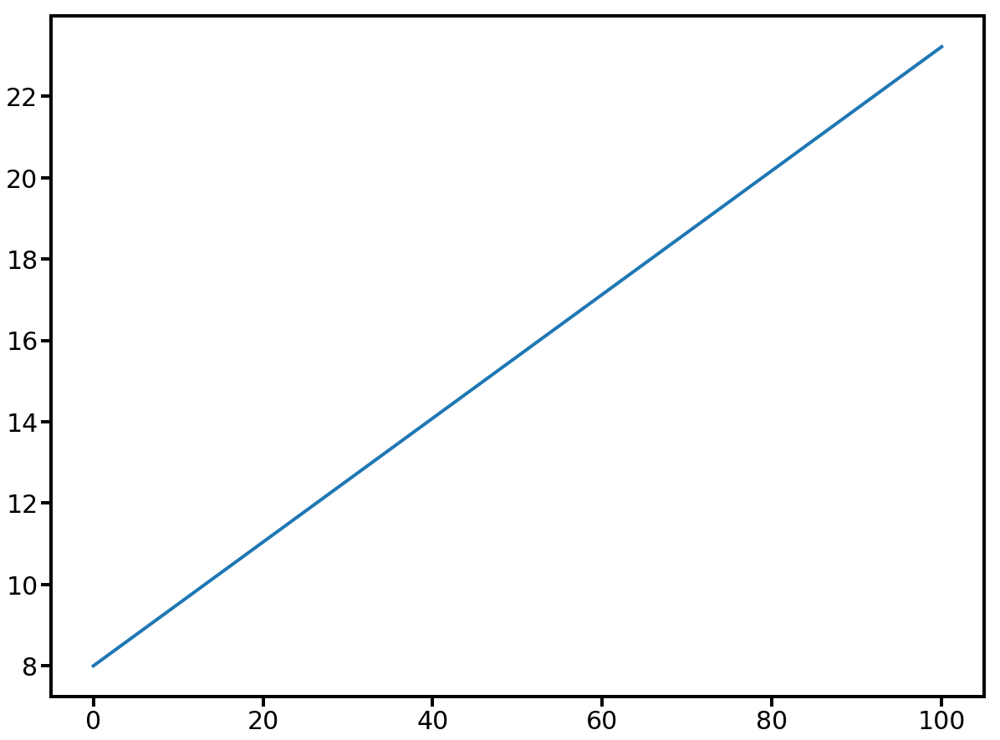

In [32]:
plt.plot(powersT1, temp)

In [33]:
def poly(x, a, b, c):
    return a*(x**b)+c

In [34]:
Temp = np.linspace(1, 10, 10)
specificHeat = [0.00000774, 0.00006192, 0.0002092, 0.0004937, 0.0009665, 0.001669, 0.002651, 0.003960, 0.005637, 0.00774]
len(specificHeat)

10

In [35]:
tempsKS = np.array([5, 10, 20, 40, 60])
cpCS = np.array([0.340e-4, 0.276e-3, 0.341e-2, 0.441e-1, 0.115])
cpCS = cpCS*28

In [36]:
# Temp = np.append(Temp)

In [37]:
popt_cp, pcov_cp = curve_fit(poly, Temp, specificHeat, bounds = (0, [1, 5, 0.1]))

In [38]:
test_temps = np.linspace(0, 10, 200)

(-1, 12)

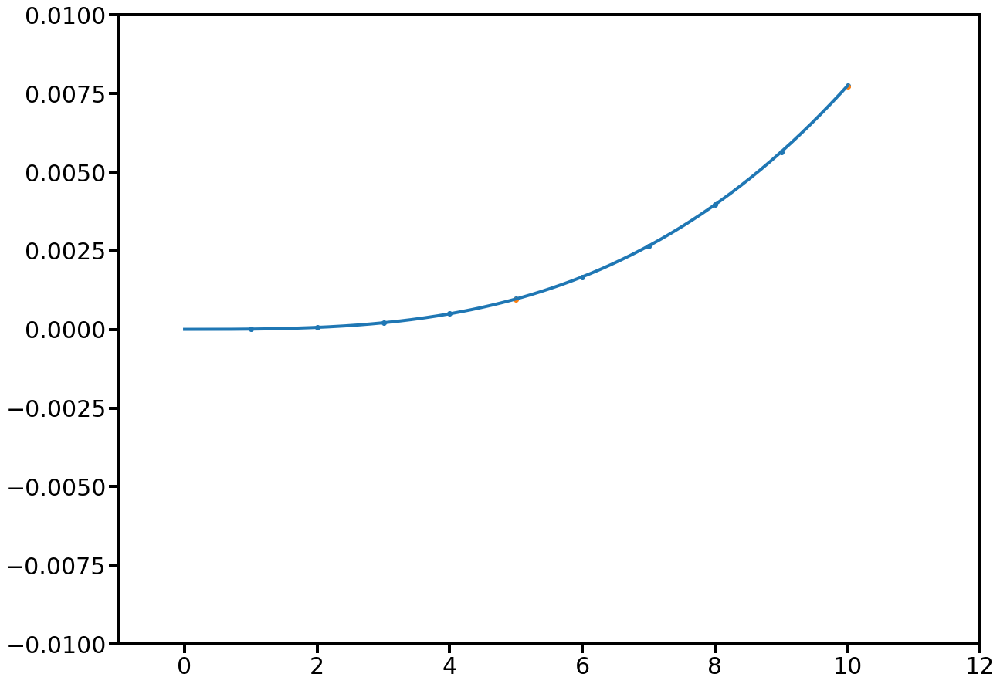

In [39]:
plt.scatter(Temp, specificHeat)
plt.plot(test_temps, poly(test_temps, *popt_cp))
plt.scatter(tempsKS, cpCS)
plt.ylim([-0.01, 0.01])
plt.xlim([-1, 12])

In [40]:
popt_cp

array([  7.66862254e-06,   3.00391570e+00,   7.04376363e-07])

In [41]:

T=np.linspace(0, 30, 100000)
Q=T*(7.67e-6*T**(3.00)+7.04e-7)*moles
tempHeat = pd.DataFrame({'Heat': Q, 'Temperature': T})


In [42]:
layout = go.Layout(
    title = "Temperature vs Energy",
    yaxis=dict(
        title = "Temperature"
    ),
    xaxis=dict(
        title="Heat"
    )
)

trace1 = go.Scatter(
    x=Q,
    y=T,
    mode='lines',
)

fig = go.Figure(data=[trace1], layout=layout)
lpy.offline.iplot(fig)

In [43]:
# tempHeat = tempHeat.set_index('Heat')

In [44]:
tempHeat.index.get_loc(0.0001, method = 'nearest')

0

In [45]:
tempHeat.iloc[26667]['Temperature']

8.0001800018000182

In [46]:
tempHeat.loc[tempHeat['Temperature'] == 8]

,Heat,Temperature


In [47]:
def findNearestTemp(en):
    tempHeat_sort = tempHeat.iloc[(tempHeat['Heat'] - en).abs().argsort()[:2]]
    ind = tempHeat_sort.index[1]
    return tempHeat.loc[ind, 'Temperature']

In [48]:
tempHeat.iloc[23333]['Temperature']

6.9999699996999967

In [49]:
baseEn = tempHeat.iloc[26667]['Heat']
baseEn7k = tempHeat.iloc[23333]['Heat']
baseEn7k

6.1116077122749663e-05

In [50]:
powersT1 = np.logspace(-5,2.1, 100)
powersT12 = powersT1/100000
heatingEn = baseEn + powersT12
heatingEn7k = baseEn7k + powersT12
temps2 = []
temps7k = []

for i in heatingEn:
    temp = findNearestTemp(i)
    temps2.append(temp)
    
for i in heatingEn7k:
    temp = findNearestTemp(i)
    temps7k.append(temp)
    
temps7k
T1sb = (0.0064/0.042)*1/(fixx1(temps, *popt))

T1sb
# T1sb*1000

array([  3.55672516e+03,   3.29949204e+03,   2.98130909e+03,
         2.68484768e+03,   2.36719225e+03,   2.01587308e+03,
         1.64035223e+03,   1.32974394e+03,   8.83149141e+02,
         5.97612398e+02,   3.90833592e+02,   1.76108460e+02,
         1.08861307e+02,   6.50650469e+01,   4.83065297e+01,
         2.64628889e+01,   1.77967425e+01,   1.11285375e+01,
         6.90054310e+00,   4.14905783e+00,   2.58390636e+00,
         2.16011019e+00,   1.23435794e+00,   6.52557082e-01,
         4.94416094e-01,   2.72595200e-01,   1.40654758e-01,
         6.48902245e-02,   4.13286667e-02,   2.17316010e-02,
         9.76659316e-03,   5.40113240e-03,   3.14255051e-03,
         1.41450888e-03,   6.55447196e-04,   3.59792704e-04,
         2.94212872e-04,   1.46538915e-04,   1.00379449e-04,
         5.81571055e-05,   3.41542001e-05,   1.71062696e-05,
         9.79062780e-06,   6.35444576e-06,   3.37883787e-06,
         2.28397936e-06,   1.37199744e-06,   8.70483505e-07,
         6.84480990e-07,

In [51]:
(0.0064/0.042)*1/(fixx1(8.4, *popt))

0.0036923540736336176

In [52]:
# def getT1T2(tempsinput, powersT1inp):
#     T1sheat = (0.0064/0.042)*1/(fixx1(tempsinput, *popt))
#     T1sioninp = getIonT1(powersT1inp/1000, 1080e-9, np.pi*1**2)
#     T1sTotRateinp = 1/T1sheat + 1/T1sioninp
#     T1sTotinp = 1/T1sTotRateinp
#     T2_ID_rateinp = ((5/2) *(mu_0/(4*np.pi))*((2*mu_B)**2/(hbar))*(donDens/2))
#     T2_SDinp = np.sqrt(((18*np.sqrt(3)/mu_0)*(hbar/((2*mu_B)**2))*(T1sTotinp/donDens)))
#     T2_SD_rateinp = 1/T2_SDinp
#     T2_rateinp = T2_ID_rateinp + 1/T1sTotinp + T2_SD_rateinp
#     T2sinp = 1/T2_rateinp
#     return T1sTotinp, T2sinp

In [53]:
temps2 = np.array(temps2)
temps7k = np.array(temps7k)

In [54]:
# a, b = getT1T2(temps7k, powersT1/1000)
# a, b

In [55]:
T1sb = (0.0064/0.042)*1/(fixx1(temps2, *popt))
T2_ID_rateb = ((5/2) *(mu_0/(4*np.pi))*((2*mu_B)**2/(hbar))*(donDens/2))
T2_SDb = np.sqrt(((18*np.sqrt(3)/mu_0)*(hbar/((2*mu_B)**2))*(T1sb/donDens)))
T2_SD_rateb = 1/T2_SDb
T2_rateb = T2_ID_rateb + 1/T1sb + T2_SD_rateb
T2sb = 1/T2_rateb
# 1/T2_ID_rate
# 1/T2_SD_rate
# T2sb = T2sb
# T2sb

In [56]:
# T1sb = T1sb*1000
# T2sb = T2sb*1000
T2sb*1000
T2_ID_rateb

2448.7262713739606

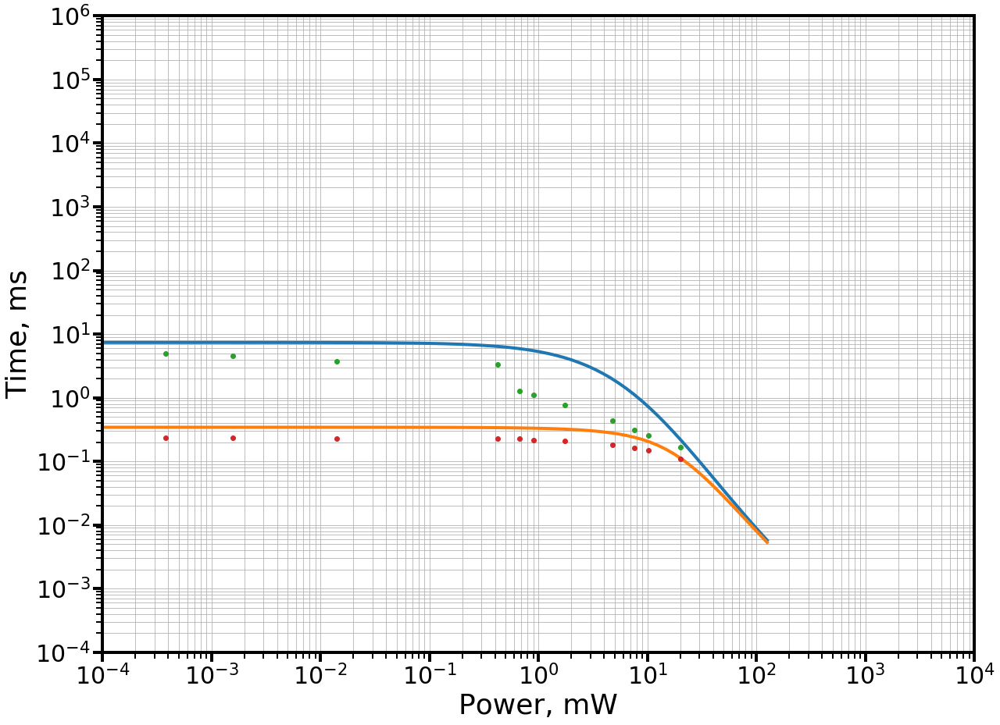

In [57]:
plot2 = plt.plot(powersT1, T1sb*1000, powersT1, T2sb*1000)
# plt.plot(powersT1, T2sb*1000)
plt.errorbar(t1_1058.index.values, t1_1058['T1a'], yerr = t1_1058['T1a Error'], linestyle = 'none', marker = 'o')
plt.errorbar(t2_1058.index.values, t2_1058['T2'], yerr = t2_1058['T2 Error'], linestyle = 'none', marker = 'o')
# plt.plot(powersT1, T1sion*1000)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Power, mW')
plt.ylabel('Time, ms')
plt.xlim([0.0001, 10000])
plt.ylim([0.0001, 1000000])
plt.grid(which='both')

In [58]:
T2sb*1000

array([ 0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.34355271,  0.34355271,  0.34355271,
        0.34355271,  0.34351448,  0.34351448,  0.34351448,  0.3435336 ,
        0.34349536,  0.34349536,  0.34351448,  0.34347623,  0.3434571 ,
        0.34347623,  0.3434571 ,  0.34343796,  0.34341882,  0.34336138,
        0.34336138,  0.34332306,  0.34324637,  0.34322719,  0.34316962,
        0.34309279,  0.34297743,  0.34288118,  0.34276553,  0.34264973,
        0.34245639,  0.34226262,  0.34206842,  0.34179582,  0.34144411,
        0.341091  ,  0.34061803,  0.34008298,  0.33946481,  0.33872157,
        0.33787075,  0.33682738,  0.33556469,  0.33413817,  0.33

In [59]:
popt

array([  3.00000000e-45,   2.12441205e-08,   8.12439135e+07])

In [60]:
fixx1(8, *popt)

20.602314314432167

In [61]:
t1_1058


,T1a,T1a Error,T1b,T1b Error
0.902606,1.096083,0.034418,6.744744,0.187467
0.421639,3.359889,0.050232,3.359889,0.050232
0.014240,3.729229,0.048314,3.729229,0.048314
4.798820,0.441843,0.007816,6.614629,0.109267
0.000379,4.932700,0.036284,4.932700,0.036284
20.000000,0.165226,0.002544,5.520935,0.082822
1.757260,0.772755,0.019250,7.191736,0.171318
0.672032,1.259604,0.045337,7.254276,0.246299
7.648640,0.315185,0.005809,6.420111,0.117520
10.272880,0.256518,0.004851,6.054457,0.113920


In [62]:
def getPhotonFlux(power, wavelength, area):
    photEn = hbar*c/(2*np.pi*wavelength)
    totPhot = power/photEn
    print(totPhot)
    return totPhot/area

In [63]:
testPhotFlux = getPhotonFlux(20e-3, 1080e-9, 0.1*0.1)

4.2950903675670144e+18


In [64]:
sig = 1.5e-16
donDens = 6e21/1e6

In [65]:
ionRate = -donDens*testPhotFlux*sig

In [66]:
ionRate*Vol

-1.5462325323241253e+19

In [67]:
Vol

0.04000000000000001

In [68]:
Vol*donDens

240000000000000.03

In [69]:
1/(ionRate/donDens)

-1.5521598141468324e-05

In [70]:
def getIonT1(power, wavelength, area):
    photFlux = getPhotonFlux(power, wavelength, area)
    ioniseRate = photFlux*sig
    T1Rate = ioniseRate# + 1/darkT1
    T1 = 1/T1Rate
    return T1

In [71]:
print(getIonT1(20e-3, 1080e-9, 0.1*0.1))

4.2950903675670144e+18
1.5521598141468328e-05


In [72]:
getIonT1(powersT1/1000, 1080e-9, np.pi*1**2)

[  2.14754518e+12   2.53314169e+12   2.98797289e+12   3.52447006e+12
   4.15729647e+12   4.90374828e+12   5.78422716e+12   6.82279798e+12
   8.04784649e+12   9.49285518e+12   1.11973184e+13   1.32078217e+13
   1.55793154e+13   1.83766161e+13   2.16761783e+13   2.55681842e+13
   3.01590083e+13   3.55741252e+13   4.19615383e+13   4.94958256e+13
   5.83829109e+13   6.88656920e+13   8.12306798e+13   9.58158286e+13
   1.13019773e+14   1.33312724e+14   1.57249319e+14   1.85483784e+14
   2.18787808e+14   2.58071645e+14   3.04408981e+14   3.59066289e+14
   4.23537438e+14   4.99584524e+14   5.89286034e+14   6.95093649e+14
   8.19899255e+14   9.67113985e+14   1.14076145e+15   1.34558770e+15
   1.58719095e+15   1.87217461e+15   2.20832771e+15   2.60483785e+15
   3.07254226e+15   3.62422404e+15   4.27496151e+15   5.04254033e+15
   5.94793964e+15   7.01590539e+15   8.27562677e+15   9.76153392e+15
   1.15142390e+16   1.35816461e+16   1.60202608e+16   1.88967342e+16
   2.22896848e+16   2.62918471e+16

array([  9.75250774e+03,   8.26797456e+03,   7.00941801e+03,
         5.94243977e+03,   5.03787766e+03,   4.27100859e+03,
         3.62087284e+03,   3.06970118e+03,   2.60242924e+03,
         2.20628574e+03,   1.87044347e+03,   1.58572333e+03,
         1.34434347e+03,   1.13970662e+03,   9.66219726e+02,
         8.19141120e+02,   6.94450918e+02,   5.88741140e+02,
         4.99122574e+02,   4.23145806e+02,   3.58734272e+02,
         3.04127504e+02,   2.57833014e+02,   2.18585502e+02,
         1.85312273e+02,   1.57103916e+02,   1.33189454e+02,
         1.12915267e+02,   9.57272307e+01,   8.11555684e+01,
         6.88020141e+01,   5.83289261e+01,   4.94500584e+01,
         4.19227378e+01,   3.55412309e+01,   3.01311213e+01,
         2.55445421e+01,   2.16561350e+01,   1.83596238e+01,
         1.55649097e+01,   1.31956089e+01,   1.11869646e+01,
         9.48407744e+00,   8.04040490e+00,   6.81648915e+00,
         5.77887867e+00,   4.89921394e+00,   4.15345235e+00,
         3.52121109e+00,

In [73]:

T1sion = getIonT1(powersT1/1000, 1080e-9, np.pi*1**2)
T2_ID_rate_ion = ((5/2) *(mu_0/(4*np.pi))*((2*mu_B)**2/(hbar))*(donDens/2))
T2_SD_ion = np.sqrt(((18*np.sqrt(3)/mu_0)*(hbar/((2*mu_B)**2))*(T1sion/donDens)))
T2_SD_rate_ion = 1/T2_SD_ion
T2_rate_ion = T2_ID_rate_ion + 1/T1sion + T2_SD_rate_ion
T2sion = 1/T2_rate_ion
# 1/T2_ID_rate
# 1/T2_SD_rate
# T2sb = T2sb
# T2sb

[  2.14754518e+12   2.53314169e+12   2.98797289e+12   3.52447006e+12
   4.15729647e+12   4.90374828e+12   5.78422716e+12   6.82279798e+12
   8.04784649e+12   9.49285518e+12   1.11973184e+13   1.32078217e+13
   1.55793154e+13   1.83766161e+13   2.16761783e+13   2.55681842e+13
   3.01590083e+13   3.55741252e+13   4.19615383e+13   4.94958256e+13
   5.83829109e+13   6.88656920e+13   8.12306798e+13   9.58158286e+13
   1.13019773e+14   1.33312724e+14   1.57249319e+14   1.85483784e+14
   2.18787808e+14   2.58071645e+14   3.04408981e+14   3.59066289e+14
   4.23537438e+14   4.99584524e+14   5.89286034e+14   6.95093649e+14
   8.19899255e+14   9.67113985e+14   1.14076145e+15   1.34558770e+15
   1.58719095e+15   1.87217461e+15   2.20832771e+15   2.60483785e+15
   3.07254226e+15   3.62422404e+15   4.27496151e+15   5.04254033e+15
   5.94793964e+15   7.01590539e+15   8.27562677e+15   9.76153392e+15
   1.15142390e+16   1.35816461e+16   1.60202608e+16   1.88967342e+16
   2.22896848e+16   2.62918471e+16

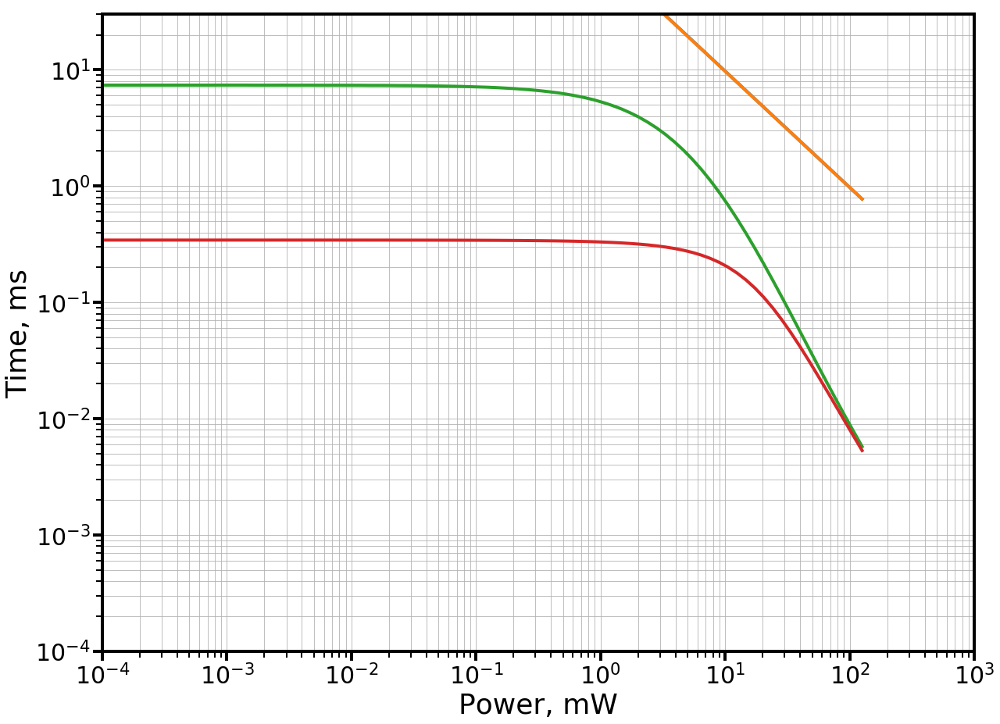

In [74]:
plt.plot(powersT1, T1sion*1000)
plt.plot(powersT1, T2sion*1000)
plt.plot(powersT1, T1sb*1000)
plt.plot(powersT1, T2sb*1000)
plt.xscale('log')
plt.yscale('log')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Power, mW')
plt.ylabel('Time, ms')
plt.xlim([0.0001, 1000])
plt.ylim([0.0001, 30])
plt.grid(which='both')

In [75]:
T1sion

array([  9.75250774e+03,   8.26797456e+03,   7.00941801e+03,
         5.94243977e+03,   5.03787766e+03,   4.27100859e+03,
         3.62087284e+03,   3.06970118e+03,   2.60242924e+03,
         2.20628574e+03,   1.87044347e+03,   1.58572333e+03,
         1.34434347e+03,   1.13970662e+03,   9.66219726e+02,
         8.19141120e+02,   6.94450918e+02,   5.88741140e+02,
         4.99122574e+02,   4.23145806e+02,   3.58734272e+02,
         3.04127504e+02,   2.57833014e+02,   2.18585502e+02,
         1.85312273e+02,   1.57103916e+02,   1.33189454e+02,
         1.12915267e+02,   9.57272307e+01,   8.11555684e+01,
         6.88020141e+01,   5.83289261e+01,   4.94500584e+01,
         4.19227378e+01,   3.55412309e+01,   3.01311213e+01,
         2.55445421e+01,   2.16561350e+01,   1.83596238e+01,
         1.55649097e+01,   1.31956089e+01,   1.11869646e+01,
         9.48407744e+00,   8.04040490e+00,   6.81648915e+00,
         5.77887867e+00,   4.89921394e+00,   4.15345235e+00,
         3.52121109e+00,

## 

In [76]:
T2sb*1000

array([ 0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,  0.3435336 ,
        0.3435336 ,  0.3435336 ,  0.34355271,  0.34355271,  0.34355271,
        0.34355271,  0.34351448,  0.34351448,  0.34351448,  0.3435336 ,
        0.34349536,  0.34349536,  0.34351448,  0.34347623,  0.3434571 ,
        0.34347623,  0.3434571 ,  0.34343796,  0.34341882,  0.34336138,
        0.34336138,  0.34332306,  0.34324637,  0.34322719,  0.34316962,
        0.34309279,  0.34297743,  0.34288118,  0.34276553,  0.34264973,
        0.34245639,  0.34226262,  0.34206842,  0.34179582,  0.34144411,
        0.341091  ,  0.34061803,  0.34008298,  0.33946481,  0.33872157,
        0.33787075,  0.33682738,  0.33556469,  0.33413817,  0.33

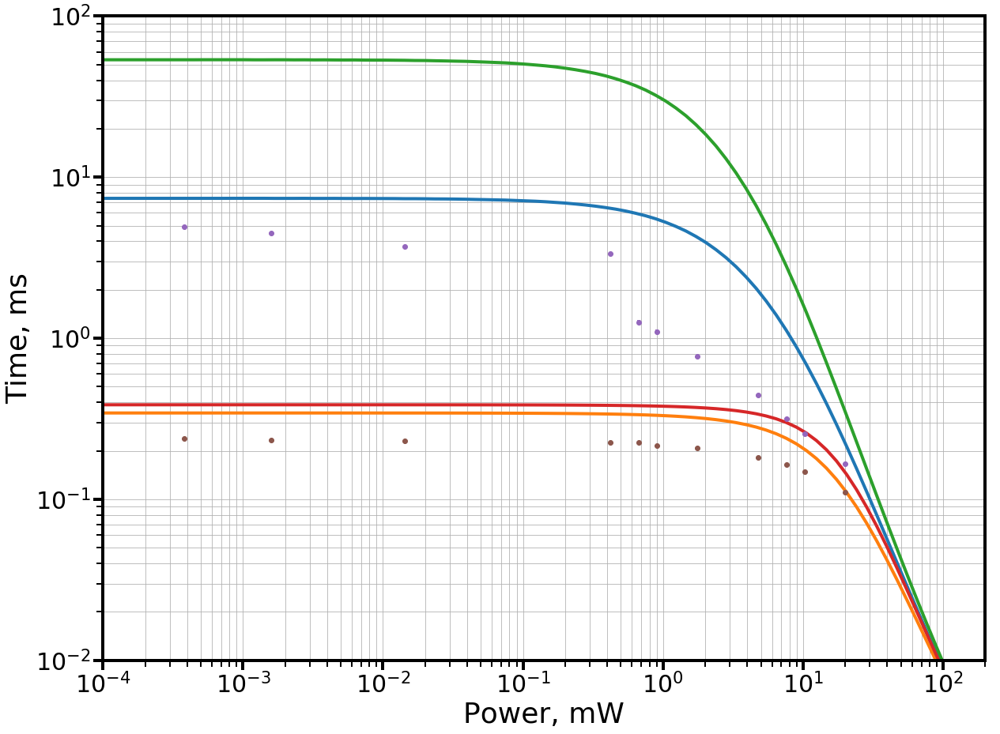

In [88]:
t2 = plt.plot(powersT1, T1sb*1000)
plt.plot(powersT1, T2sb*1000)
plt.plot(powersT1, T1s7k*1000)
plt.plot(powersT1, T2s7k*1000)
plt.errorbar(t1_1058.index.values, t1_1058['T1a'], yerr = t1_1058['T1a Error'], linestyle = 'none', marker = 'o')
plt.errorbar(t2_1058.index.values, t2_1058['T2'], yerr = t2_1058['T2 Error'], linestyle = 'none', marker = 'o')
# plt.plot(powersT1, T1sion*1000)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Power, mW')
plt.ylabel('Time, ms')
plt.xlim([0.0001, 200])
plt.ylim([0.01, 100])
plt.grid(which='both')

In [ ]:
T2sb

In [79]:
T1sTotRate = 1/T1sb + 1/T1sion
T1sTot = 1/T1sTotRate
T2sTotRate = 1/T2sb + 1/T2sion
T2sTot = 1/T2sTotRate


In [80]:
t1scomb = pd.read_pickle('../Data/t1scomb')
# t2scomb = pd.read_pickle('../Data/t2scomb')

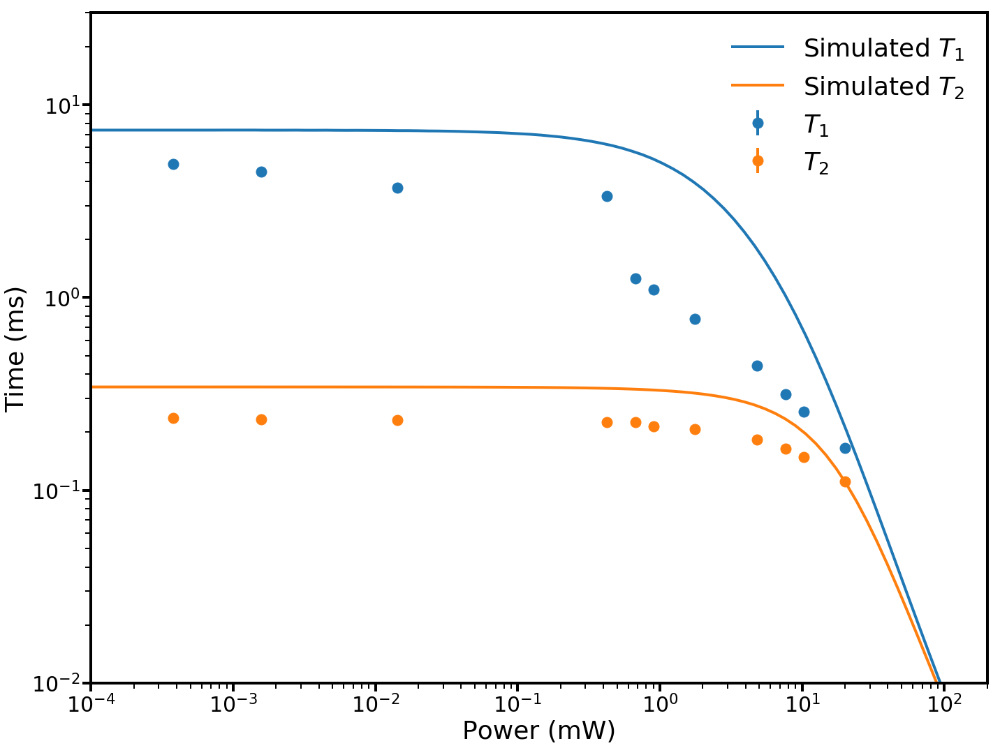

In [81]:
plt.plot(powersT1, T1sTot*1000, label= r'Simulated $T_1$')
plt.plot(powersT1, T2sTot*1000, label = r'Simulated $T_2$')
# plt.plot(powersT1, T1sb*1000)
# plt.plot(powersT1, T2sb*1000)
plt.errorbar(t1_1058.index.values, t1_1058['T1a'], yerr = t1_1058['T1a Error'], linestyle = 'none', marker = 'o', color = 'C0', ms = 15, label = r'$T_1$')
plt.errorbar(t2_1058.index.values, t2_1058['T2'], yerr = t2_1058['T2 Error'], linestyle = 'none', marker = 'o', color = 'C1', ms = 15, label = r'$T_2$')
plt.legend(fontsize = 36, ncol = 1, fancybox = True, frameon = False, framealpha = 0)
plt.xscale('log')
plt.yscale('log')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Power (mW)')
plt.ylabel('Time (ms)')
plt.xlim([0.0001, 200])
plt.ylim([0.01, 30])
plt.tight_layout()
plt.savefig('Figures/simt1t2.pdf', transparent = True)
# plt.grid(which='both')

In [82]:
# trace1 = go.Scatter(
#     x=powersT1,
#     y=T1sTot*1000,
#     mode='line',
#     name='Simulated T1'
# )

# trace2 = go.Scatter(
#     x=powersT1,
#     y=T2sTot*1000,
#     mode='line',
#     name='Simulated T2'
# )

# trace3 = go.Scatter(
#     x=
# )

# layout = go.Layout(
#     title = "Simple Example",
#     yaxis=dict(
#         title = "Time, ms",
#         type='log'
#     ),
#     xaxis=dict(
#         title="Power, mW",
#         type='log'
#     )
# )
# data = [trace1, trace2]
# fig = go.Figure(data=data, layout=layout)
# lpy.offline.iplot(fig)

In [83]:
def getT1T2(tempsinput, powersT1inp):
    T1sheat = (0.0064/0.042)*1/(fixx1(tempsinput, *popt))
    T1sioninp = getIonT1(powersT1inp/1000, 1080e-9, np.pi*1**2)
    T1sTotRateinp = 1/T1sheat + 1/T1sioninp
    T1sTotinp = 1/T1sTotRateinp
    T2_ID_rateinp = ((5/2) *(mu_0/(4*np.pi))*((2*mu_B)**2/(hbar))*(donDens/2))
    print("Instantaneous diffusion T2:", 1/T2_ID_rateinp)
    print("donDens", donDens)
    T2_SDinp = np.sqrt(((18*np.sqrt(3)/mu_0)*(hbar/((2*mu_B)**2))*(T1sTotinp/donDens)))
    print("T2_SD_inp",T2_SDinp)
    T2_SD_rateinp = 1/T2_SDinp
    T2_rateinp = T2_ID_rateinp + 1/T1sTotinp + T2_SD_rateinp
    T2sinp = 1/T2_rateinp
    return T1sTotinp, T2sinp

In [84]:
donDens = 6e21
T1s7k, T2s7k = getT1T2(temps7k, powersT1/1000)
T1s7k

[  2.14754518e+09   2.53314169e+09   2.98797289e+09   3.52447006e+09
   4.15729647e+09   4.90374828e+09   5.78422716e+09   6.82279798e+09
   8.04784649e+09   9.49285518e+09   1.11973184e+10   1.32078217e+10
   1.55793154e+10   1.83766161e+10   2.16761783e+10   2.55681842e+10
   3.01590083e+10   3.55741252e+10   4.19615383e+10   4.94958256e+10
   5.83829109e+10   6.88656920e+10   8.12306798e+10   9.58158286e+10
   1.13019773e+11   1.33312724e+11   1.57249319e+11   1.85483784e+11
   2.18787808e+11   2.58071645e+11   3.04408981e+11   3.59066289e+11
   4.23537438e+11   4.99584524e+11   5.89286034e+11   6.95093649e+11
   8.19899255e+11   9.67113985e+11   1.14076145e+12   1.34558770e+12
   1.58719095e+12   1.87217461e+12   2.20832771e+12   2.60483785e+12
   3.07254226e+12   3.62422404e+12   4.27496151e+12   5.04254033e+12
   5.94793964e+12   7.01590539e+12   8.27562677e+12   9.76153392e+12
   1.15142390e+13   1.35816461e+13   1.60202608e+13   1.88967342e+13
   2.22896848e+13   2.62918471e+13

array([  5.35824361e-02,   5.35824360e-02,   5.35824360e-02,
         5.35824359e-02,   5.35824358e-02,   5.35824357e-02,
         5.35824356e-02,   5.35824354e-02,   5.35824353e-02,
         5.35824351e-02,   5.35824348e-02,   5.35824346e-02,
         5.35824342e-02,   5.35824338e-02,   5.35824334e-02,
         5.35824329e-02,   5.35824322e-02,   5.35824315e-02,
         5.35824306e-02,   5.35824296e-02,   5.35824284e-02,
         5.35824269e-02,   5.35824252e-02,   5.35824232e-02,
         5.36167726e-02,   5.36167698e-02,   5.36167665e-02,
         5.36167627e-02,   5.36167581e-02,   5.35480725e-02,
         5.35480661e-02,   5.35823871e-02,   5.35823783e-02,
         5.35137341e-02,   5.35480271e-02,   5.34794252e-02,
         5.35136903e-02,   5.34451291e-02,   5.34108695e-02,
         5.34450774e-02,   5.33424065e-02,   5.33082013e-02,
         5.33081557e-02,   5.32398384e-02,   5.31716037e-02,
         5.30354627e-02,   5.30014162e-02,   5.28318613e-02,
         5.26965907e-02,

In [85]:
T2s7k

array([  3.86282086e-04,   3.86282086e-04,   3.86282086e-04,
         3.86282086e-04,   3.86282086e-04,   3.86282086e-04,
         3.86282086e-04,   3.86282086e-04,   3.86282086e-04,
         3.86282085e-04,   3.86282085e-04,   3.86282085e-04,
         3.86282085e-04,   3.86282085e-04,   3.86282085e-04,
         3.86282085e-04,   3.86282085e-04,   3.86282085e-04,
         3.86282084e-04,   3.86282084e-04,   3.86282084e-04,
         3.86282084e-04,   3.86282083e-04,   3.86282083e-04,
         3.86289670e-04,   3.86289670e-04,   3.86289669e-04,
         3.86289668e-04,   3.86289667e-04,   3.86274488e-04,
         3.86274486e-04,   3.86282075e-04,   3.86282073e-04,
         3.86266888e-04,   3.86274478e-04,   3.86259287e-04,
         3.86266878e-04,   3.86251681e-04,   3.86244076e-04,
         3.86251669e-04,   3.86228855e-04,   3.86221239e-04,
         3.86221228e-04,   3.86205994e-04,   3.86190748e-04,
         3.86160238e-04,   3.86152589e-04,   3.86114382e-04,
         3.86083763e-04,

In [86]:
T1Powers = np.loadtxt('T1Powers.txt')
T1Powers7k = np.loadtxt('T1Powers7k.txt')
T1sa = np.loadtxt('T1sa.txt')
T1sa7kd = np.loadtxt('T1sa7kd.txt')
T1aErrors= np.loadtxt('T1aErrors.txt')  
T1aErrors7k= np.loadtxt('T1aErrors7k.txt')

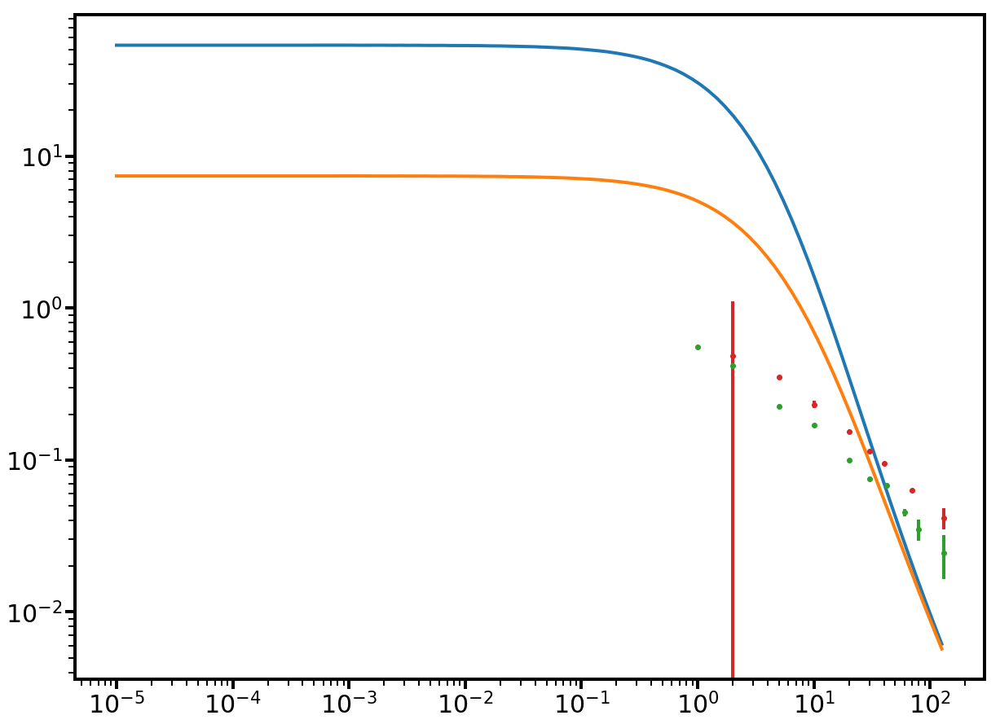

In [87]:
plt.plot(powersT1, T1s7k*1000, powersT1, T1sTot*1000)
plt.errorbar(T1Powers, T1sa, yerr = T1aErrors, marker = 'o', linestyle = 'none')
plt.errorbar(T1Powers7k, T1sa7kd, yerr = T1aErrors7k, marker = 'o', linestyle = 'none')
plt.xscale('log')
plt.yscale('log')

In [ ]:
np.pi*(5**2)*2

In [ ]:
157/0.04

In [ ]:
2/0.001

# Going Further with $T_1$

$$
\alpha
$$